In [1]:
# Program for finding the shape of the lipid bilayer with the initial direction of the director

from time import time 
import scipy.optimize
import numpy as np
import matplotlib
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px
from sklearn.metrics import ndcg_score

In [2]:
#words
def get_length_words(text):
    if type(text) == float:
        print(text)
    return len(text.split())

# function for potential minimization  
def potent(param, lens, scores):
    
    elem = scores - (param[0]+param[1]*lens+param[2]*lens**2+param[3]*lens**3)*lens
    elem = np.abs(elem)
    return np.sum(elem)

# funciton for properly sentense length
def minimum(x, param):
    # quadric form required for only positive value of sentence length
    y = x**2
    return - (param[0]+param[1]*y+param[2]*y**2+param[3]*y**3)*y

#  This loop is required for avoiding local minimums due to increasing
#  function outcome by larger data sample
def minimization_proc (start, stop, step, x0, tot_lens, tot_scores):
    dividers = list(range(start,stop,step))
    
    for i in dividers:
        lens = tot_lens[start:i]
        scores = tot_scores[start:i]
        res = scipy.optimize.basinhopping(potent, x0, minimizer_kwargs
        = {"method": "L-BFGS-B", "args": (lens, scores)})
        x0 = res.x

    return x0

def counter(df, num):
    try:
        return df.value_counts()[num]
    except Exception: 
        return 0

# our baseline model
def baseline(zero, one, two, three, four, lenin, start, stop, key):
    pred_score = []
    
    for i in lenin:
        a =[ counter(zero[key][start:stop],i) ]
        a.append(counter(one[key][start:stop],i))
        a.append(counter(two[key][start:stop],i))
        a.append(counter(three[key][start:stop],i))
        a.append(counter(four[key][start:stop],i))
        normal = sum(a)
        if normal != 0:
            pred_score.append((a[1]+a[2]*2+a[3]*3+a[4]*4)/normal)
        else:
            pred_score.append(0)
            
    data = {'score': pred_score, 'len': lenin}
    df = pd.DataFrame.from_dict(data)
    
    return df

def neg_check(a):
    if a < 0:
        print(a)
    return a

In [3]:
train_data = 'data/arr_train.csv'
test_data = 'data/arr_test.csv'
df = pd.read_csv(train_data)
dt = pd.read_csv(test_data)
df.head()

,Unnamed: 0,text,lem_text,comment,lem_comments,score
0,0,how many summer y combinator fundees decided n...,many summer combinator fundees decide continue...,going back to school is not identical with giv...,go back school identical give up founder go ba...,0
1,1,how many summer y combinator fundees decided n...,many summer combinator fundees decide continue...,there will invariably be those who don't see t...,invariably see success set for fall back origi...,1
2,2,how many summer y combinator fundees decided n...,many summer combinator fundees decide continue...,for me school is a way to be connected to what...,school way connect go real world enter school ...,2
3,3,how many summer y combinator fundees decided n...,many summer combinator fundees decide continue...,i guess it really depends on how hungry you ar...,guess really depend hungry much believe produc...,3
4,4,how many summer y combinator fundees decided n...,many summer combinator fundees decide continue...,i know pollground decided to go back to school...,know pollground decide go back school get comb...,4


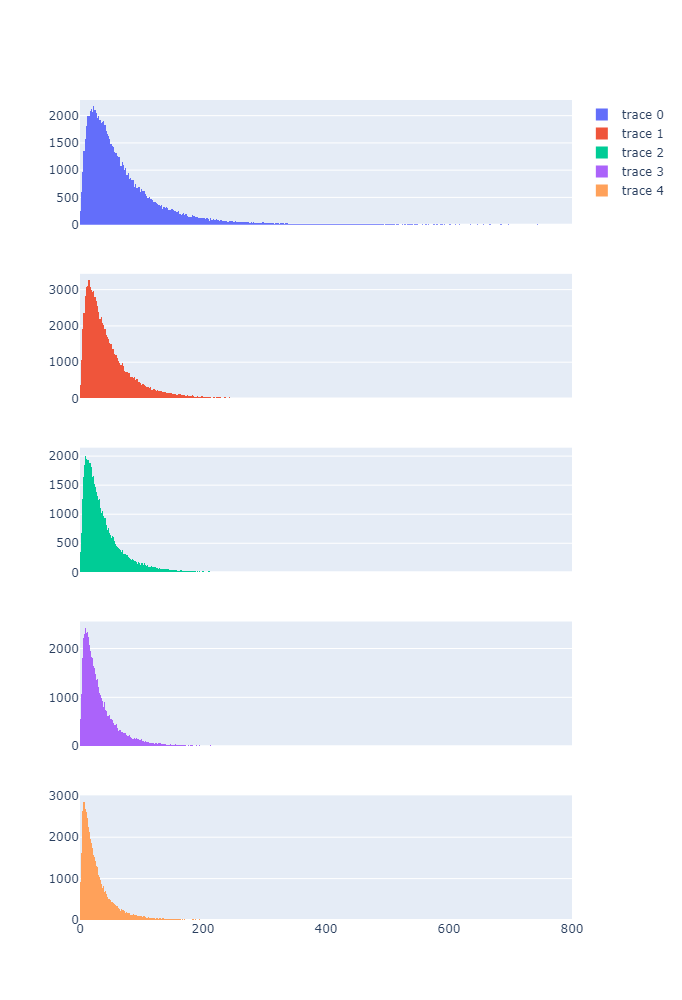

In [7]:
# Распределения для всех скоров нормированы (одинаковое общее число элементов (проверено))
# По этой причине мы можем сравнивать результаты для каждой длинны.
df['com_length'] = df['lem_comments'].fillna('')
df['com_length'] = df['com_length'].fillna('').apply(get_length_words).to_numpy()

df_zero = df[df['score'] == 0]
df_one = df[df['score'] == 1]
df_two = df[df['score'] == 2]
df_three = df[df['score'] == 3]
df_four = df[df['score'] == 4]
# second largest comment length
limit = int(df_zero['com_length'].nlargest(1))

#simple prediction by statistical weights for each length
lenin = range(limit)

fig = make_subplots(rows=5, cols=1, shared_xaxes=True)

fig.add_trace(go.Histogram(
    x=df_zero['com_length']
), row=1, col=1)

fig.add_trace(go.Histogram(
    x=df_one['com_length']
), row=2, col=1)

fig.add_trace(go.Histogram(
    x=df_two['com_length']
), row=3, col=1)

fig.add_trace(go.Histogram(
    x=df_three['com_length']
), row=4, col=1)

fig.add_trace(go.Histogram(
    x=df_four['com_length']
), row=5, col=1)

fig.update_layout(
    height=1000, 
    width=800,
    xaxis_range=[0, 800]
)

In [ ]:
# potential constants compute

# vector initialization.
x0 = np.array([ 1, 1,  1, 1])
dimen = len(df['com_length'])
gl_st = dimen//150

#x0 = minimization_proc(0, gl_st, 40, x0, tot_lens, tot_scores)

''' This loop is required for avoiding local minimums due to increasing
   function outcome by larger data sample 
'''    
for i in tqdm(range(150)):
    if i == 0:
        x0 = minimization_proc(100, gl_st*(i+1), 60, x0, tot_lens, tot_scores)
    else:
        x0 = minimization_proc(gl_st*(i+1)-401, gl_st*(i+1), 100, x0, tot_lens, tot_scores)
  
param = x0
en = potent(param, tot_lens, tot_scores)
print(f'Energy = {en}')
print(f'Parameters = {param}')

In [ ]:
# Лучший результат был получен при этих значениях для потенциала.
Energy = 15981435.645543428
Parameters = [ 1.12023578e-01 -1.88194595e-03  1.04155021e-05 -1.86656737e-08]

In [ ]:
# больше элементов чем в прлошлом.
Energy = 42851510.53425637
Parameters = [ 2.97653133e-01 -6.06910232e-03  3.34376390e-05 -5.23004563e-08]

In [ ]:
# determination of coment optimal length 
x0 = np.array([1.])
res = scipy.optimize.minimize(minimum, x0, args = param)
best_length = np.sqrt(res.x)
en = minimum(best_length*2, param)
print(f'properly length = {best_length}')


In [8]:
x = np.arange(1, 16, 0.1)
plt.plot(np.sqrt(x), -minimum(x, para))
plt.show()

NameError: name 'para' is not defined

In [9]:

pred_score = []
key = 'com_length'
#def baseline(zero, one, two, three, four, lenin, start, stop, key):
dl = baseline(df_zero, df_one, df_two, df_three, df_four, lenin, 0, limit//2, key)
du = baseline(df_zero, df_one, df_two, df_three, df_four, lenin, limit//2, limit, key)


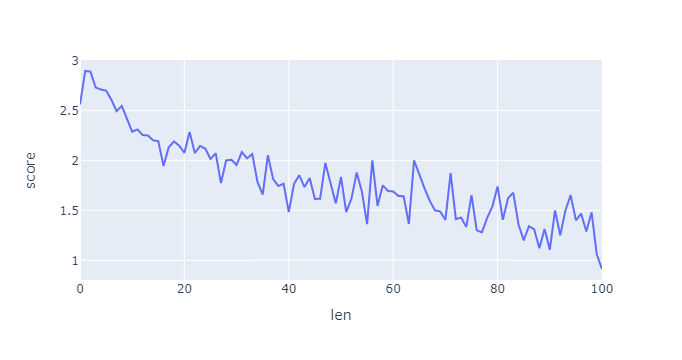

In [10]:
fig = px.line(dl.loc[0:100], x='len', y='score')
#fig = px.line(dy.loc[0:100], x='len', y='score')
fig.show()

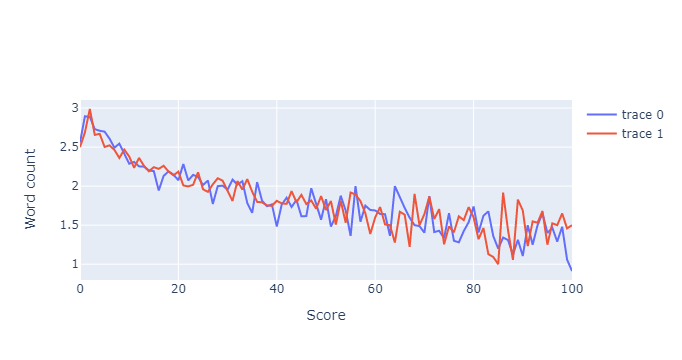

In [11]:
fig = go.Figure()

fig.add_trace(
    go.Scatter(x=np.array(dl.loc[0:100]['len']), y=np.array(dl.loc[0:100]['score'])))

fig.add_trace(
    go.Scatter(x=np.array(du.loc[0:100]['len']), y=np.array(du.loc[0:100]['score'])))

fig.update_layout(
    xaxis_title = 'Score',
    yaxis_title = 'Word count'
)
    
fig.show()

In [61]:
%%time 

tot_lens = df['com_length'].to_numpy()
tot_scores = df['score'].to_numpy()
true = np.array([])
pred = np.array([])
l = len(tot_lens)

for i in tqdm(range(l//2, l)):
    true = np.append(true, tot_scores[i])
    pred = np.append(pred, dl['score'] [dl['len'] == tot_lens[i]].to_numpy())

true = true.reshape(1, -1)
pred = pred.reshape(1, -1)
ndcg_score(true, pred)

100%|██████████| 220268/220268 [01:41<00:00, 2161.35it/s]


CPU times: total: 1min 24s
Wall time: 1min 41s


0.9626097095973432

In [53]:
true = true.reshape(1, -1)
pred = pred.reshape(1, -1)
ndcg_score(true[:2], pred[:2])

0.8906127498178341

In [ ]:
true = du['score'].to_numpy().reshape(1, -1)
predict = dl['score'].to_numpy().reshape(1, -1)

In [ ]:
fig = px.line(dx.loc[0:400], x='len', y='score')
fig.show()

In [ ]:
du.to_csv('data/baseline.csv')